# Audio source separation

Requires `scipy==1.10.1` and `mdct==0.4`. 

Execute the next cell to install these libraries then restart the kernel.

In [1]:
!pip install mdct==0.4

In [2]:
# imports
import matplotlib.pyplot as plt
import numpy as np
import scipy.io.wavfile as wavfile
from scipy.signal import hamming
from scipy.spatial.distance import cdist

import IPython.display as ipd
from mdct.fast import mdct, imdct
from scipy.io.wavfile import write

plt.rcParams['figure.figsize'] = (12,8)

In [3]:
# useful functions

def plot_sound(data, rate, title=None):
    if data.ndim == 1:
        data = data[:,np.newaxis]
    times = np.arange(data.shape[0])/rate
    plt.figure(figsize=(30,6))
    for channel in data.T:
        plt.fill_between(times, channel)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    plt.xlim(times[0], times[-1])
    if title:
        plt.title(title)
    plt.show()
    
def play_sound(data, rate):
    return ipd.display(ipd.Audio(data.T, rate=rate))

T = 220501, M = 2


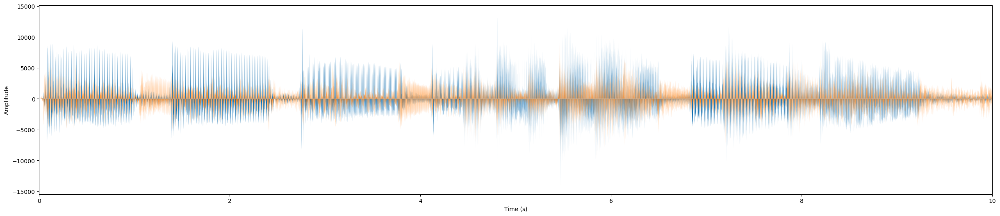

In [4]:
fname = 'mix.wav'

rate, x = wavfile.read(fname)
print('T = {:d}, M = {:d}'.format(*x.shape))
plot_sound(x, rate)
play_sound(x, rate)

In [5]:
write('new_mix.wav', rate, np.array(x, dtype=np.int16)) # to write a new wave file

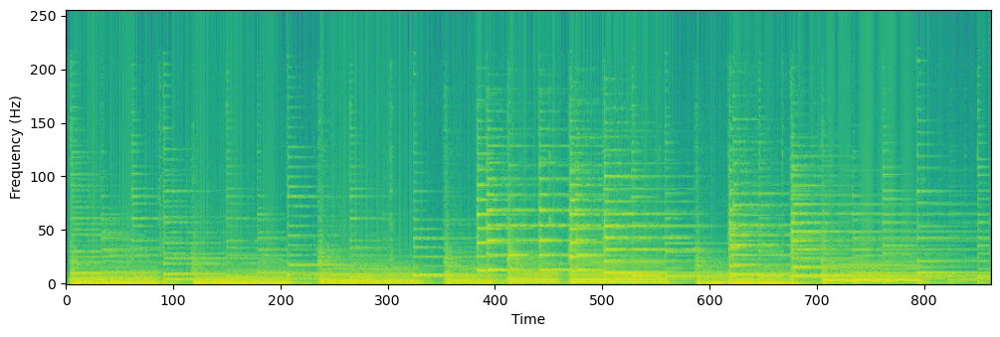

In [6]:
X = mdct(x, window=hamming, framelength=512)
Z = X.view(dtype=np.complex128)[...,0]

X_norm = np.abs(Z)**2

plt.imshow(np.log(X_norm+1e-10), origin='lower')
plt.xlabel('Time')
plt.ylabel('Frequency (Hz)')
plt.show()

In [7]:
#Queation 1
T, M = x.shape
print(f'T = {T}, M = {M}')
play_sound(x, rate)

T = 220501, M = 2


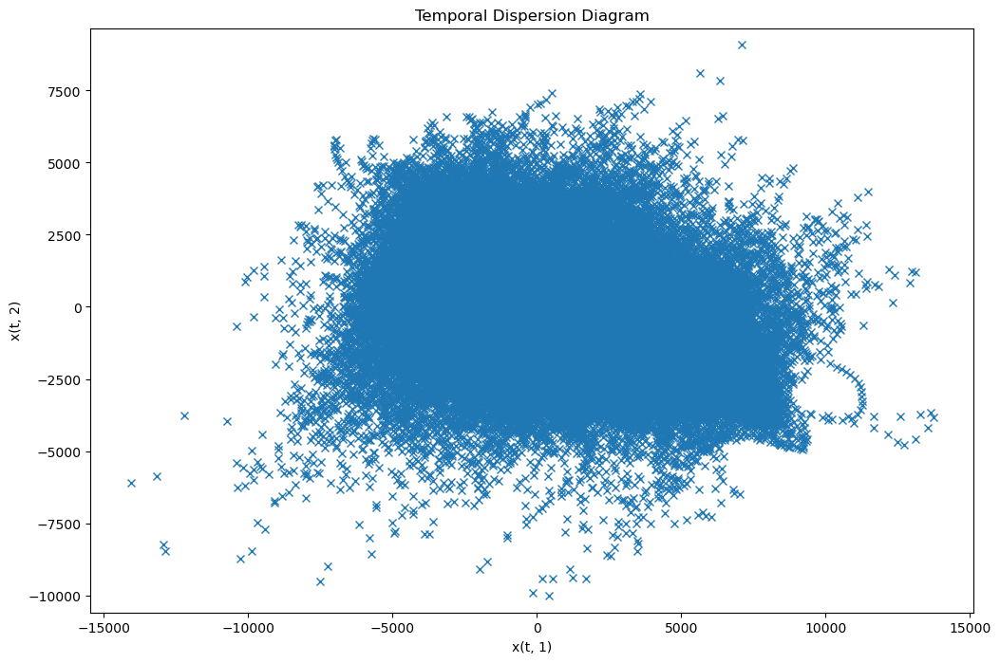

In [8]:
#Question 2
plt.plot(x[:, 0], x[:, 1], 'x')
plt.axis('equal')
plt.title('Temporal Dispersion Diagram')
plt.xlabel('x(t, 1)')
plt.ylabel('x(t, 2)')
plt.show()

C:\Users\xie\AppData\Local\Temp\ipykernel_174296\2873452468.py:3: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(np.abs(mdct_x[:, :, 0])**2), cmap='gray', origin='lower')


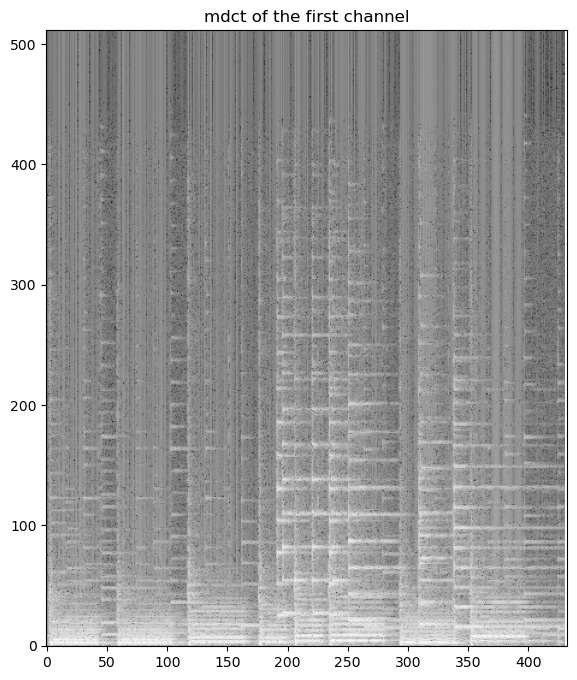

C:\Users\xie\AppData\Local\Temp\ipykernel_174296\2873452468.py:6: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(np.abs(mdct_x[:, :, 1])**2), cmap='gray', origin='lower')


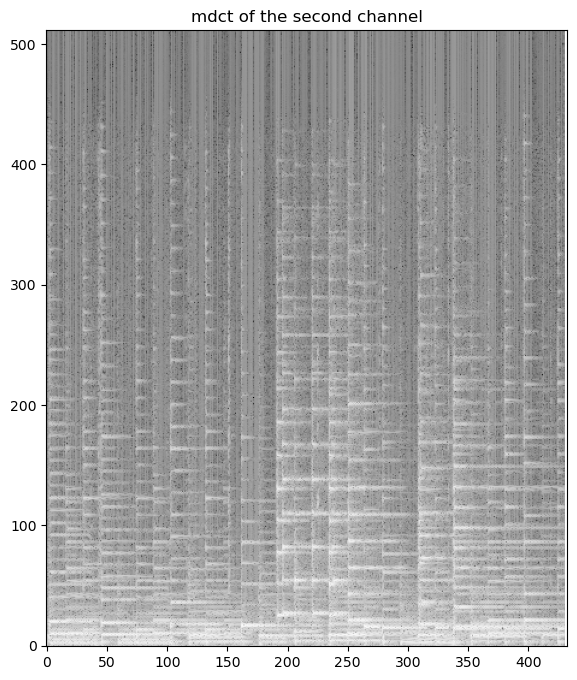

In [9]:
#Question 3
mdct_x = mdct(x, window=hamming)
plt.imshow(np.log(np.abs(mdct_x[:, :, 0])**2), cmap='gray', origin='lower')
plt.title('mdct of the first channel')
plt.show()
plt.imshow(np.log(np.abs(mdct_x[:, :, 1])**2), cmap='gray', origin='lower')
plt.title('mdct of the second channel')
plt.show()

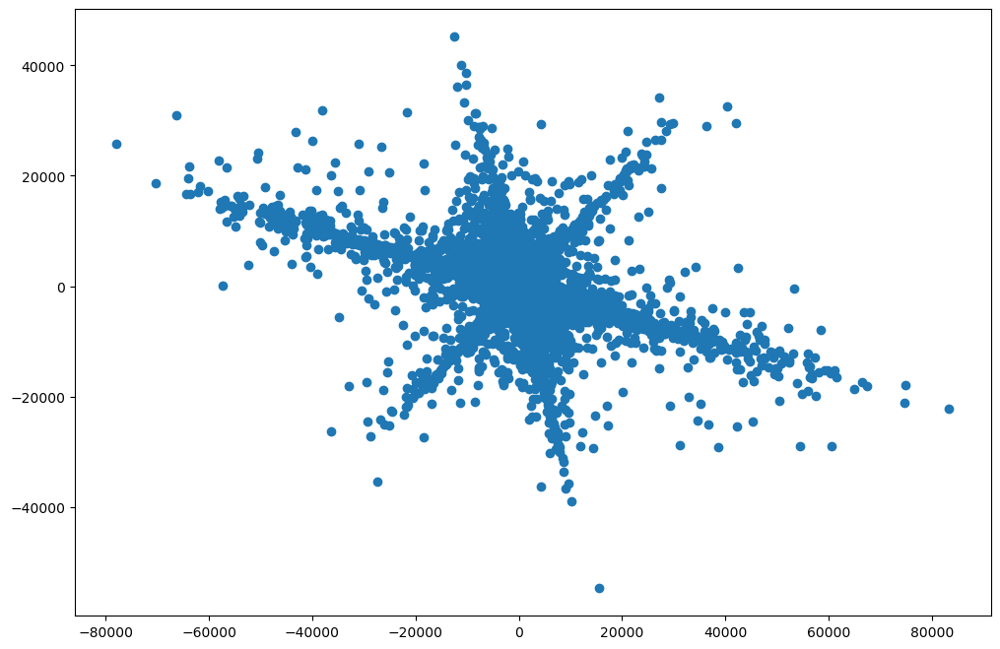

In [10]:
#Question 4
Z = mdct_x[..., 0] + 1j * mdct_x[..., 1]
plt.scatter(mdct_x[..., 0], mdct_x[..., 1])
plt.show()

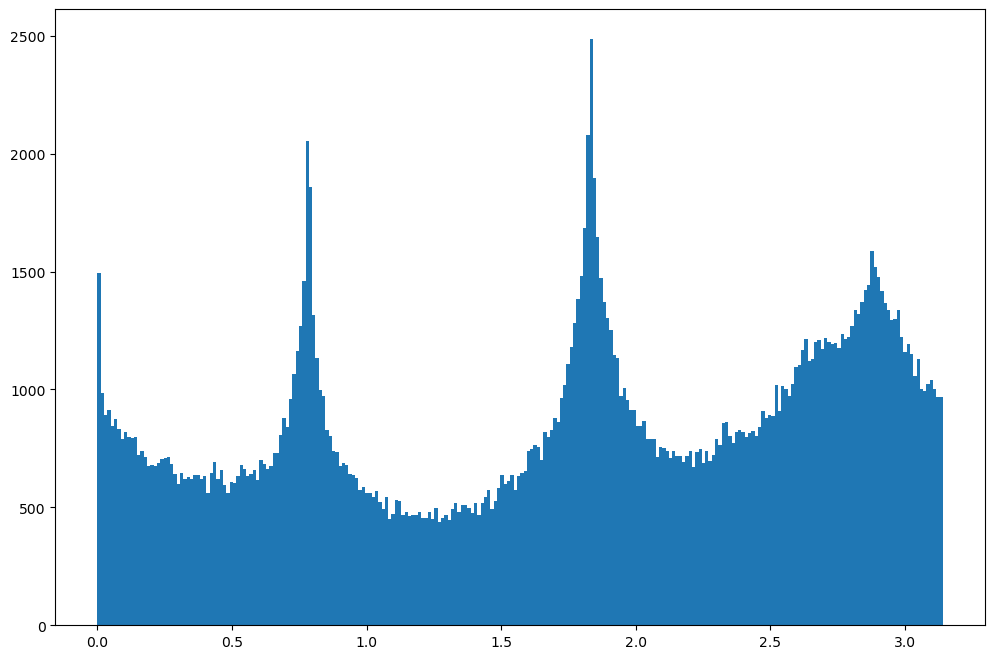

In [11]:
#Question 5
plt.hist(np.angle(Z.flatten()) % np.pi, bins=256)
plt.show()

In [12]:
#Question 6
theta = np.linspace(-np.pi / 2, np.pi / 2, num=3)
B = np.zeros((Z.shape[0], Z.shape[1], len(theta)))
for f in range(Z.shape[0]):
    for n in range(Z.shape[1]):
        deviations = np.abs(np.sin(theta - np.angle(Z[f, n])))
        k_min = np.argmin(deviations)
        B[f, n, k_min] = 1

print(B)

[[[1. 0. 0.]
  [1. 0. 0.]
  [0. 1. 0.]
  ...
  [0. 0. 1.]
  [0. 0. 1.]
  [0. 1. 0.]]

 [[1. 0. 0.]
  [0. 0. 1.]
  [0. 1. 0.]
  ...
  [0. 1. 0.]
  [0. 0. 1.]
  [0. 1. 0.]]

 [[1. 0. 0.]
  [1. 0. 0.]
  [0. 1. 0.]
  ...
  [1. 0. 0.]
  [0. 0. 1.]
  [0. 1. 0.]]

 ...

 [[1. 0. 0.]
  [0. 1. 0.]
  [1. 0. 0.]
  ...
  [1. 0. 0.]
  [1. 0. 0.]
  [0. 1. 0.]]

 [[1. 0. 0.]
  [0. 1. 0.]
  [1. 0. 0.]
  ...
  [0. 0. 1.]
  [1. 0. 0.]
  [0. 1. 0.]]

 [[1. 0. 0.]
  [0. 1. 0.]
  [1. 0. 0.]
  ...
  [1. 0. 0.]
  [1. 0. 0.]
  [0. 1. 0.]]]


In [13]:
#Question 7
B_ext = np.expand_dims(B, axis=2)
B_ext = np.repeat(B_ext, 2, axis=2)
f, n = Z.shape
Y = np.zeros((f, n, 2, 3))

mask0 = B_ext[..., 0]
mask1 = B_ext[..., 1]
mask2 = B_ext[..., 2]
Y[:, :, :, 0] = mask0 * mdct_x
Y[:, :, :, 1] = mask1 * mdct_x
Y[:, :, :, 2] = mask2 * mdct_x
print(Y.shape)
y0 = imdct(Y[..., 0])
y1 = imdct(Y[..., 1])
y2 = imdct(Y[..., 2])

(512, 433, 2, 3)


In [14]:
play_sound(y0, rate)
play_sound(y1, rate)
play_sound(y2, rate)

In [16]:
S = np.zeros((f, n, 3))
for k in range(n):
  for f_k in range(f):
    teta_f_k = np.angle(Z[f_k, k])%np.pi
    S[f_k, k] = np.cos(teta_f_k)*Y[f_k, k, 0] + np.sin(teta_f_k)*Y[f_k, k, 0]

s0 = imdct(S[..., 0])
s1 = imdct(S[..., 1])
s2 = imdct(S[..., 2])

play_sound(s0, rate)
play_sound(s1, rate)
play_sound(s2, rate)

In [18]:
S = np.zeros((f, n, 3))

theta = np.array([np.pi/4, 0, np.pi * 3/4])

for k in range(n):
  for f_k in range(f):
    for id_src in range(3):
      S[f_k, k, id_src] = np.cos(theta[id_src])*Y[f_k, k, 0, id_src] + np.sin(theta[id_src])*Y[f_k, k, 1, id_src]


s0 = imdct(S[..., 0])
s1 = imdct(S[..., 1])
s2 = imdct(S[..., 2])

play_sound(s0, rate)
play_sound(s1, rate)
play_sound(s2, rate)
